# Sentinel-1 GRD Sigma0 VV Time Series (8-Bit Imagery)

### _Import functional dependencies and add repository source directory to system path_

In [1]:
import os
import yaml
from munch import munchify

In [2]:
# define repo name and get root working directory
repo = 'process-api'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo )]
root_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\process-api'

In [3]:
# get path to configuration files
cfg_path = os.path.join( root_path, 'cfg' )
cfg_path = os.path.join( cfg_path, 'sentinel-1' )
cfg_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\process-api\\cfg\\sentinel-1'

### _Load configuration file from repository cfg sub-directory_ 

In [4]:
# get pathname to configuration file
cfg_file = os.path.join( cfg_path, 's1-timeseries-sigma0-linear.yml' )

In [5]:
# print contents of configuration file
with open( cfg_file ) as f:
    print ( f.read() )

request:
    collection: SENTINEL1
    evalscript: |
                //VERSION=3
                function setup() {
                    return {
                        input: ["VV"],
                        output: { id:"default", bands: 1 }
                    }
                }
                function evaluatePixel(samples) {
                    return [2 * samples.VV]
                }
    inputs:
        - collection: SENTINEL1
          options:
            processing:
                backCoeff: SIGMA0_ELLIPSOID
responses:
    default: TIFF
aoi:
    pathname: <path_to_aoi_file>
    name: name
    distance: 500



In [6]:
# load cfg file using yaml parser
with open( cfg_file, 'r' ) as f:
    config = munchify( yaml.safe_load( f ) )

### _Define bounding box collated with Rome Leonardo de Vinci airport_

In [7]:
# setup aoi limits and resolution
coords = 12.214016, 41.733915, 12.307777, 41.805180
resolution = 10

In [8]:
# create instance of shclient class
from processapi import Client
client = Client( config )

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\sentinelhub\sh_utils.py:90: SHDeprecationWarning: Parameter base_url is deprecated and will soon be removed. Instead set config.sh_base_url = base_url and provide it with config parameter
  warnings.warn('Parameter base_url is deprecated and will soon be removed. Instead set '


In [9]:
# get utm bbox
bbox = client.getBoundingBox( coords )
print ( bbox, bbox.crs.value )

268302.1685479292,4623985.174566718,276348.39357999945,4631649.963426802 32633


In [10]:
# get aoi image dimensions
client.getBoxDimensions( bbox, resolution )

(805, 766)

### _Use Catalog API to locate coincident scenes acquired early February 2021_

In [11]:
# pick a few dates
from datetime import datetime
timeframe = { 'start' : datetime( 2021, 2, 1, 0, 0, 0 ), 
                'end' : datetime( 2021, 2, 7, 23, 59, 59 ) }

In [12]:
# get S1 acquisitions between start / end dates satisfying filter conditions
client.getDatasetTimeStamps( config.request.inputs[ 0 ], bbox, timeframe )

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\sentinelhub\sh_utils.py:90: SHDeprecationWarning: Parameter base_url is deprecated and will soon be removed. Instead set config.sh_base_url = base_url and provide it with config parameter
  warnings.warn('Parameter base_url is deprecated and will soon be removed. Instead set '


[datetime.datetime(2021, 2, 1, 5, 19, 57, tzinfo=tzutc()),
 datetime.datetime(2021, 2, 2, 5, 11, 15, tzinfo=tzutc()),
 datetime.datetime(2021, 2, 2, 17, 5, 51, tzinfo=tzutc()),
 datetime.datetime(2021, 2, 7, 5, 19, 27, tzinfo=tzutc())]

### _Download image time series from Sentinel Hub collocated with bounding box and timeframe_

In [13]:
# get time series
response = client.getTimeSeries ( bbox, timeframe, resolution )
response._df

,default,time
0,"[[3, 8, 11, 2, 2, 0, 0, 1, 8, 14, 9, 10, 13, 8...",2021-02-01 05:19:57+00:00
1,"[[3, 1, 2, 3, 2, 2, 4, 5, 5, 2, 5, 1, 5, 6, 6,...",2021-02-02 05:11:15+00:00
2,"[[2, 6, 2, 2, 3, 2, 5, 3, 4, 10, 14, 13, 11, 1...",2021-02-02 17:05:51+00:00
3,"[[23, 31, 39, 36, 23, 38, 21, 20, 43, 39, 19, ...",2021-02-07 05:19:27+00:00


### _Display VV Sigma 0 backscatter as 8-bit grayscale imagery_ 

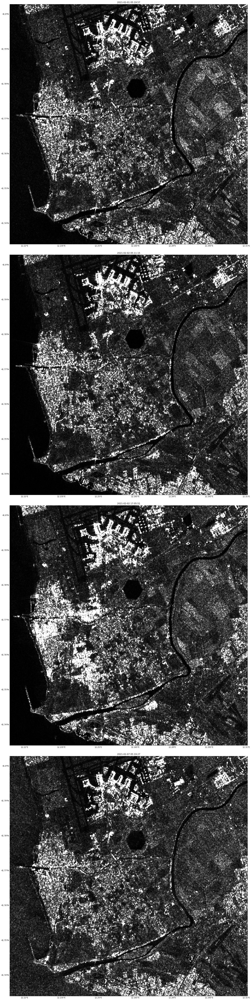

In [14]:
response.plotImages( 'default', alpha={ 'data' : 1.0, 'grid' : 0.0 }, cmap='gray' )

### _Display VV Sigma 0 backscatter superimposed on OSM imagery_

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\cartopy\crs.py:825: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\cartopy\crs.py:877: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\cartopy\crs.py:944: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


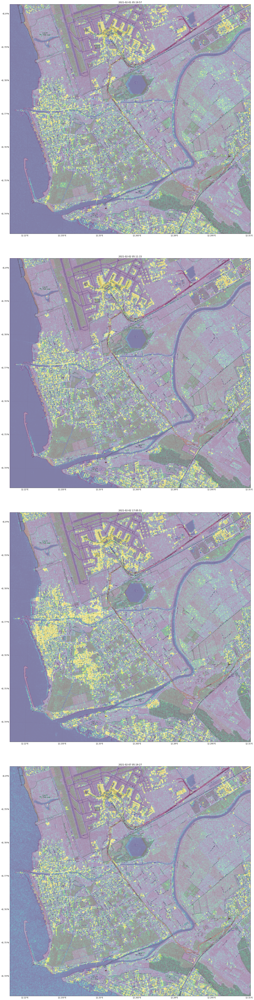

In [15]:
response.plotImages( 'default', osm_zoom=15, alpha={ 'data' : 0.4, 'grid' : 0.3 } )